In [1]:
import numpy as np
import skimage as sk
import skimage.io as skio
import scipy.signal as signal
from matplotlib import pyplot as plt
from scipy import ndimage
import cv2

In [2]:
def savefig(filename, fig):
    fig.savefig('output/' + filename, dpi=fig.dpi)

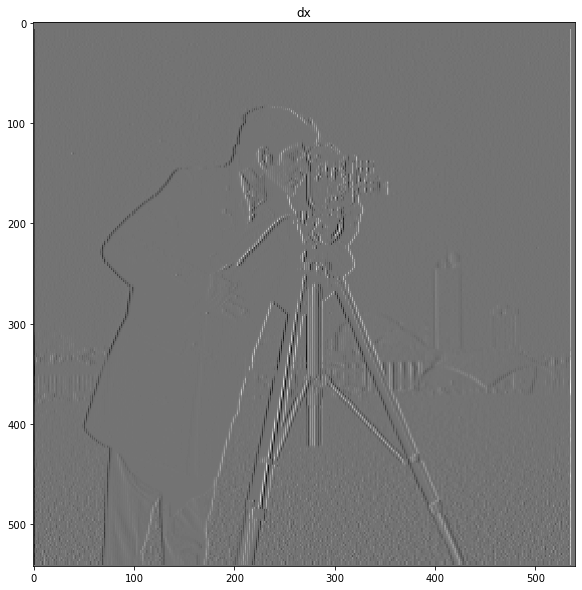

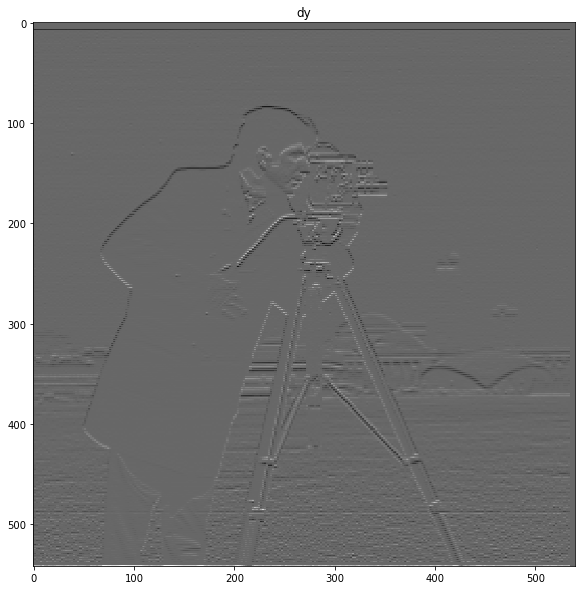

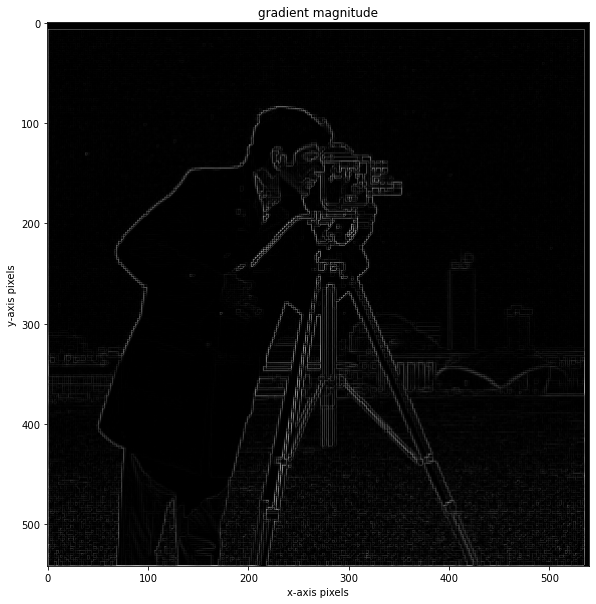

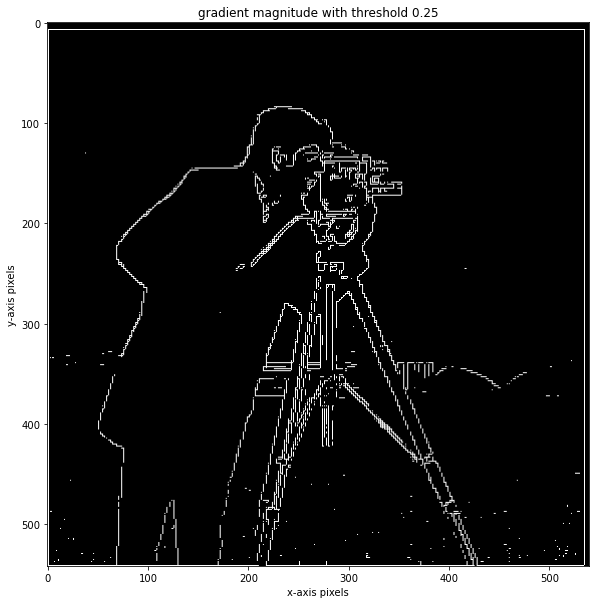

In [3]:
# name of the input file
%matplotlib inline
imname = 'images/cameraman.png'

# read in the image
im = skio.imread(imname, as_gray=True)

# convert to double (might want to do this later on to save memory)    
im = sk.img_as_float(im)

dx = np.array([1, -1])
dy = np.array([1, -1])
dx = dx.reshape(dx.shape[0], -1).T
dy = dy.reshape(dy.shape[0], -1)
convolve_dx = signal.convolve2d(im, dx, mode='same', fillvalue=0.0)
fig = plt.figure(figsize=(10, 10))
plt.imshow(convolve_dx, cmap='gray')
plt.title('dx')
savefig('dx', fig)
convolve_dy = signal.convolve2d(im, dy, mode='same', fillvalue=0.0)
fig = plt.figure(figsize=(10, 10))
plt.imshow(convolve_dy, cmap='gray')
plt.title('dy')
savefig('dy', fig)
gradient_magnitude = np.sqrt(convolve_dx**2 + convolve_dy**2)

# f, axarr = plt.subplots(2, 1)
# axarr[0].imshow(convolve_dx)
# axarr[1].imshow(convolve_dy)
fig = plt.figure(figsize=(10, 10))
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('gradient magnitude')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('gradient magnitude', fig)

def binarize(threshold, image, title):
    # threshold = 0.25

    # Binarize the gradient magnitude image
    binary_image = np.zeros_like(image)
    binary_image[image >= threshold] = 255

    fig = plt.figure(figsize=(10, 10))
    plt.imshow(binary_image, cmap='gray')
    plt.title('gradient magnitude with threshold ' + str(threshold))
    plt.xlabel('x-axis pixels')
    plt.ylabel('y-axis pixels')
    savefig(title, fig)
    
binarize(0.25, gradient_magnitude, 'gradient magnitude with threshold')

In [4]:
def gaussian(im, kernelsize, sigma):
    gaussian_1d = cv2.getGaussianKernel(kernelsize, sigma) 
    gaussian_2d = gaussian_1d @ gaussian_1d.T

    convolve_gauss = signal.convolve2d(im, gaussian_2d, mode='same', fillvalue=0.0)
    return convolve_gauss
def edges_gaussian(im, threshold):
#     guassian_1d = cv2.getGaussianKernel(7, 2) 
#     guassian_2d = guassian_1d @ guassian_1d.T

#     convolve_guass = signal.convolve2d(im, guassian_2d, mode='same', fillvalue=0.0)

    gaussian_kernel = cv2.getGaussianKernel(7, 7/3) 
    combined_kernel_x = np.outer(gaussian_kernel, dx)
    combined_kernel_y = np.outer(gaussian_kernel, dy)
#     convolve_gauss = gaussian(im, 7, 7/3)

#     plt.figure(figsize=(10, 10))
#     plt.imshow(convolve_gauss, cmap='gray')
#     plt.title('gradient magnitude')
#     plt.xlabel('x-axis pixels')
#     plt.ylabel('y-axis pixels')

    combined_kernel = np.sqrt(combined_kernel_x**2 + combined_kernel_y**2)
    gradient_mag_gaussx = signal.convolve2d(im, combined_kernel, mode='same', fillvalue=0.0)
#     gradient_mag_gaussx = signal.convolve2d(im, combined_kernel_x, mode='same', fillvalue=0.0)
#     gradient_mag_gaussy = signal.convolve2d(im, combined_kernel_y, mode='same', fillvalue=0.0)
#     gradient_mag_gauss = np.sqrt(gradient_mag_gaussx**2 + gradient_mag_gaussy**2)

    fig = plt.figure(figsize=(10, 10))
    plt.imshow(gradient_mag_gauss, cmap='gray')
    savefig('single convolution', fig)
    plt.title('single convolution')
    plt.xlabel('x-axis pixels')
    plt.ylabel('y-axis pixels')

    # binarize(2.0, gradient_mag_guass)
    binarize(threshold, gradient_mag_gauss, 'single convolution with threshold')

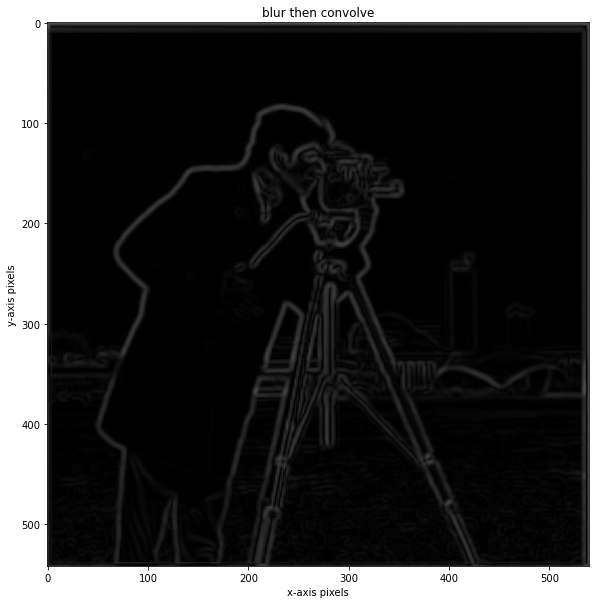

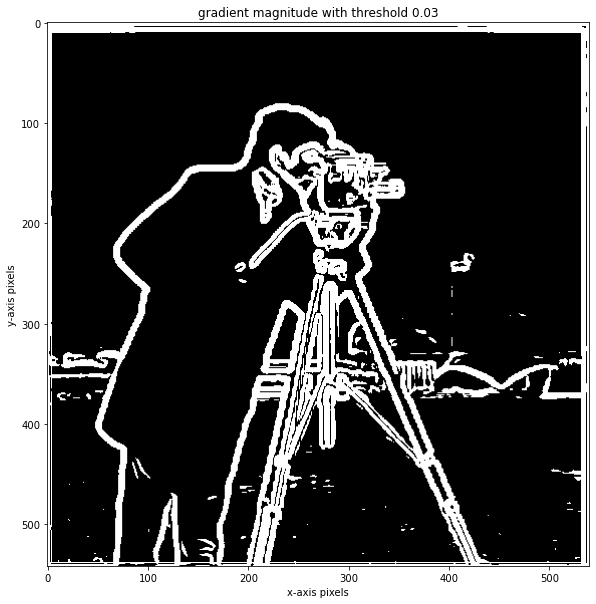

In [5]:
gaussian_1d = cv2.getGaussianKernel(7, 7/3) 
gaussian_2d = gaussian_1d @ gaussian_1d.T

convolve_gauss = gaussian(im, 7, 7/3)
convolve_dx = signal.convolve2d(convolve_gauss, dx, mode='same', fillvalue=0.0)
convolve_dy = signal.convolve2d(convolve_gauss, dy, mode='same', fillvalue=0.0)
gradient_mag_gauss = np.sqrt(convolve_dx**2 + convolve_dy**2)

# gradient_mag_gauss = signal.convolve2d(convolve_gauss, np.sqrt(dx**2 + dy**2), mode='same', fillvalue=0.0)
# gradient_mag_gauss = signal.convolve2d(im, convolve_gauss, mode='same', fillvalue=0.0)

fig = plt.figure(figsize=(10, 10))
plt.imshow(gradient_mag_gauss, cmap='gray')
savefig('blur then convolve', fig)
plt.title('blur then convolve')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')

# binarize(2.0, gradient_mag_guass)
binarize(0.03, gradient_mag_gauss, 'blur then convolve with threshold')

Edges are softer and the contrast and texture of the grass is definitely less.

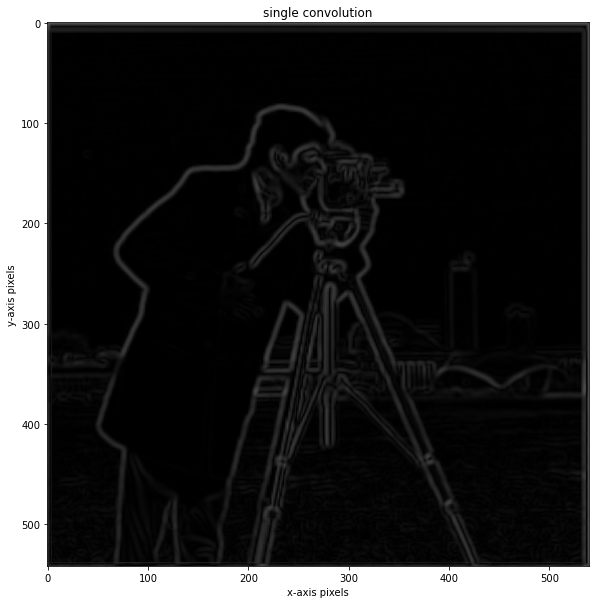

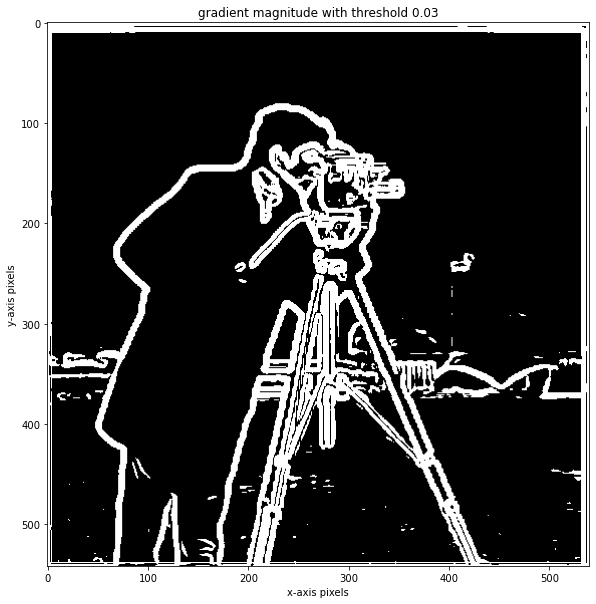

In [6]:
edges_gaussian(im, 0.03)

In [7]:
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform as sktr



def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
    len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
    dscale = len2/len1
    if dscale < 1:
        im1 = sktr.rescale(im1, dscale)
    else:
        im2 = sktr.rescale(im2, 1./dscale)
    return im1, im2

def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
    assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2


if __name__ == "__main__":
    # 1. load the image
    # 2. align the two images by calling align_images
    # Now you are ready to write your own code for creating hybrid images!
    pass


In [8]:
## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies
def gaussian(im, kernelsize, sigma):
    gaussian_1d = cv2.getGaussianKernel(kernelsize, sigma) 
    gaussian_2d = gaussian_1d @ gaussian_1d.T

    convolve_gauss = signal.convolve2d(im, gaussian_2d, mode='same', fillvalue=0.0)
    return convolve_gauss
%matplotlib
def hybrid_image(image1, image2, sigma1, sigma2, kernelsize, std):
    kernelsize1, kernelsize2 = kernelsize
    std1, std2 = std
    low_freq = np.zeros_like(image1)
#     low_freq = gaussian(image1, kernelsize1, std1)
    low_freq[:,:,0]  = gaussian(image1[:,:,0], kernelsize1, std1)
    low_freq[:,:,1]  = gaussian(image1[:,:,1], kernelsize1, std1)
    low_freq[:,:,2]  = gaussian(image1[:,:,2], kernelsize1, std1)

#     low_freq_im2 =ge2, kernelsize2, std2)
#     high_freq = image2 - low_freq_im2
    low_freq_1 = gaussian(image2[:,:,0], kernelsize2, std2)
    low_freq_2 = gaussian(image2[:,:,1], kernelsize2, std2)
    low_freq_3 = gaussian(image2[:,:,2], kernelsize2, std2)
    high_freq = np.zeros_like(image2)
    high_freq[:,:,0] = image2[:,:,0] - low_freq_1
    high_freq[:,:,1] = image2[:,:,1] - low_freq_2
    high_freq[:,:,2] = image2[:,:,2] - low_freq_3
    
    print(np.mean(low_freq))
    print(np.mean(high_freq))
    low_freq[low_freq < sigma1] = 0
    high_freq[high_freq < sigma2] = 0
    print(np.mean(low_freq))
    print(np.mean(high_freq))
#     low_freq = cv2.normalize(low_freq, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)
#     high_freq = cv2.normalize(high_freq, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)
#     print(np.mean(low_freq))
#     print(np.mean(high_freq))
    
    hybrid = low_freq + high_freq
    hybrid /= 2.0
  
    fig = plt.figure(figsize=(10, 10))

    plt.imshow(hybrid, cmap='gray')
    return low_freq, high_freq, hybrid, fig


Using matplotlib backend: MacOSX


In [9]:
def high_freq(image, cutoff, kernelsize, sigma):
    low_freq = np.zeros_like(image)
    low_freq[:,:,0]  = image[:,:,0] - gaussian(image[:,:,0], kernelsize, sigma)
    low_freq[:,:,1]  = image[:,:,1] - gaussian(image[:,:,1], kernelsize, sigma)
    low_freq[:,:,2]  = image[:,:,2] - gaussian(image[:,:,2], kernelsize, sigma)
#     plt.figure(figsize=(10, 10))
    low_freq[low_freq < cutoff] = 0
#     plt.imshow(low_freq)
    return low_freq

In [10]:
def sharpen(image, kernelsize, sigma):
    gaussian_1 = gaussian(image[:,:,0], kernelsize, sigma)
    gaussian_2 = gaussian(image[:,:,1], kernelsize, sigma)
    gaussian_3 = gaussian(image[:,:,2], kernelsize, sigma)
    sharpened_im = np.zeros_like(image)
    sharpened_im[:,:,0] = image[:,:,0] + image[:,:,0] - gaussian_1
    sharpened_im[:,:,1] = image[:,:,1] + image[:,:,1] - gaussian_2
    sharpened_im[:,:,2] = image[:,:,2] + image[:,:,2] - gaussian_3
    return sharpened_im

In [11]:
# name of the input file
imname = 'images/taj.jpg'

# read in the image
taj = skio.imread(imname, as_gray=False)

# convert to double (might want to do this later on to save memory)    
taj = sk.img_as_float(taj)

In [12]:
sharpened_taj = sharpen(taj, 7, 7/3)

fig = plt.figure(figsize=(10, 10))
plt.imshow(taj)
plt.title('taj with no sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('taj with no sharpening', fig)

fig = plt.figure(figsize=(10, 10))
plt.imshow(sharpened_taj)
plt.title('taj with sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('taj with sharpening', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [13]:
# name of the input file
imname = 'images/lebron.jpg'

# read in the image
lebron = skio.imread(imname, as_gray=False)

# convert to double (might want to do this later on to save memory)    
lebron = sk.img_as_float(lebron)

In [14]:
sharpened_lebron = sharpen(lebron, 7, 7/3)

fig = plt.figure(figsize=(10, 10))
plt.imshow(lebron)
plt.title('lebron with no sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('lebron with no sharpening', fig)

fig = plt.figure(figsize=(10, 10))
plt.imshow(sharpened_lebron)
plt.title('lebron with sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('lebron with sharpening', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [15]:
# name of the input file
imname = 'images/kobe.jpeg'

# read in the image
kobe = skio.imread(imname, as_gray=False)

# convert to double (might want to do this later on to save memory)    
kobe = sk.img_as_float(kobe)

In [16]:
blurred_kobe = kobe - high_freq(kobe, 1e-3, 7, 7/3)
sharpened_kobe = sharpen(blurred_kobe, 7, 7/3)

fig = plt.figure(figsize=(10, 10))
plt.imshow(kobe)
plt.title('kobe with no sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('kobe with no sharpening', fig)

fig = plt.figure(figsize=(10, 10))
plt.imshow(blurred_kobe)
plt.title('kobe with blurring')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('kobe with blurring', fig)

fig = plt.figure(figsize=(10, 10))
plt.imshow(sharpened_kobe)
plt.title('blurred kobe with sharpening')
plt.xlabel('x-axis pixels')
plt.ylabel('y-axis pixels')
savefig('blurred kobe with sharpening', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [17]:
%matplotlib tk

# First load images

# high sf
im1 = plt.imread('images/DerekPicture.jpg')/255
# imname = 'images/DerekPicture.jpg'
# im1 = skio.imread(imname, as_gray=True)

# low sf
im2 = plt.imread('images/nutmeg.jpg')/255
# imname = 'images/nutmeg.jpg'
# im2 = skio.imread(imname, as_gray=True)

# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)

Please select 2 points in each image for alignment.


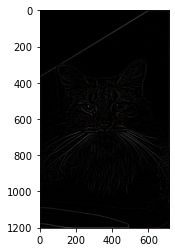

In [18]:
%matplotlib inline
plt.imshow(high_freq(im2_aligned, 1e-3, 15, 30))

0.2399529082311255
0.002391274483563537
0.20268210056905053
0.012936989403688308


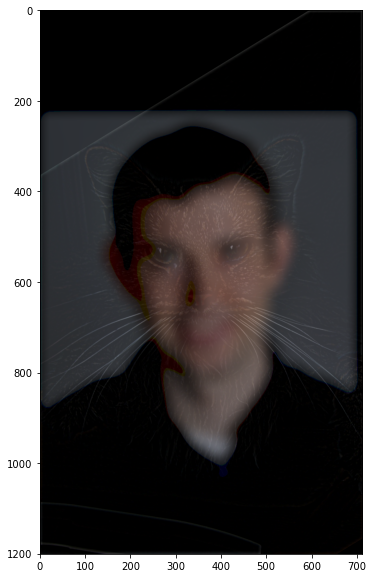

In [19]:
# Derek is low freq and nutmeg is high freq
%matplotlib inline
_, _, hybrid, fig = hybrid_image(im1_aligned, im2_aligned, 0.2, 1e-100, (45,15), (45/3,15/3))
savefig('mancat.png', fig)

In [23]:
%matplotlib tk

lion = plt.imread('images/lion.jpeg')/255
# imname = 'images/DerekPicture.jpg'
# im1 = skio.imread(imname, as_gray=True)

cat1 = plt.imread('images/cat.jpeg')/255
# imname = 'images/nutmeg.jpg'
# im2 = skio.imread(imname, as_gray=True)

# Next align images (this code is provided, but may be improved)
cat1_aligned, lion_aligned = align_images(cat1, lion)

Please select 2 points in each image for alignment.


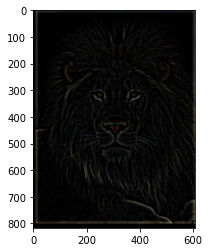

In [24]:
%matplotlib inline
plt.imshow(high_freq(lion_aligned, 1e-3, 25, 15))

In [25]:
np.median(cat1_aligned)

0.7296777171708533

In [26]:
np.median(lion_aligned)

0.4392156862745098

0.5800263529033465
0.007538701217544619
0.5800263529033465
0.043300532810216334


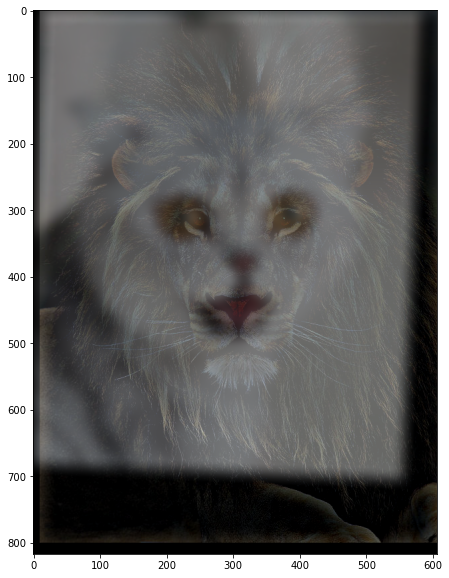

In [27]:
# cat is low freq and lion is high freq
%matplotlib inline
# hybrid = cv2.normalize(hybrid_image(cat1_aligned, lion_aligned, 1e-1000, 1e-1000, (32,50), (32/3,50/3)), None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1)
low_cat, high_lion, hybrid, fig = hybrid_image(cat1_aligned, lion_aligned, 1e-1000, 1e-1000, (32,50), (32/3,50/3))
savefig('lioncat.png', fig)

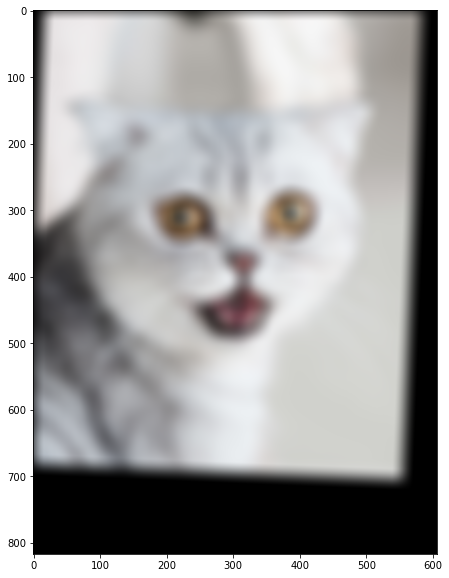

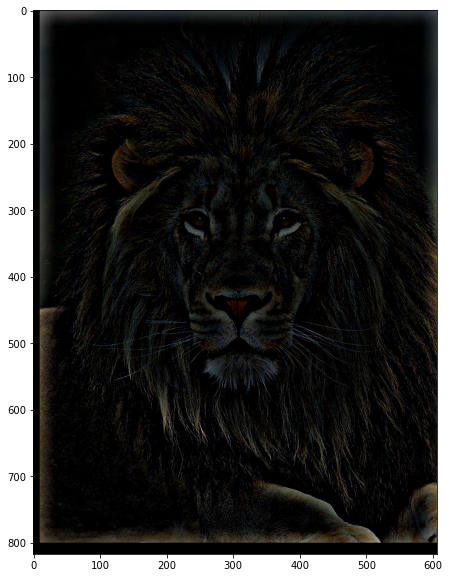

In [28]:
fig = plt.figure(figsize=(10,10))
plt.imshow(low_cat)
savefig('low cat.png', fig)

fig = plt.figure(figsize=(10,10))
plt.imshow(high_lion)
savefig('high lion.png', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


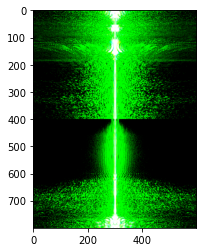

In [29]:
fig = plt.figure()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cat1)))))
savefig('cat fourier.png', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


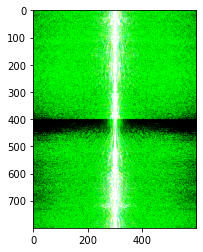

In [30]:
fig = plt.figure()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(lion)))))
savefig('lion fourier.png', fig)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_93517/4124977421.py:2: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_cat)))))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


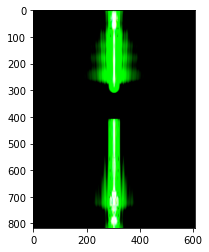

In [31]:
fig = plt.figure()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_cat)))))
savefig('filtered cat fourier.png', fig)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_93517/2040860857.py:2: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_lion)))))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


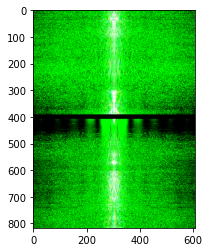

In [32]:
fig = plt.figure()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_lion)))))
savefig('filtered lion fourier.png', fig)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_93517/584742651.py:2: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid)))))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


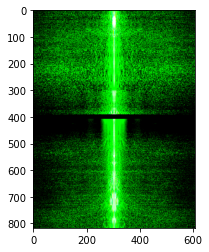

In [33]:
fig = plt.figure()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid)))))
savefig('hybrid fourier.png', fig)

In [34]:
%matplotlib tk

dog = plt.imread('images/dog.jpeg')/255
# imname = 'images/DerekPicture.jpg'
# im1 = skio.imread(imname, as_gray=True)

cat2 = plt.imread('images/cat.jpeg')/255
# imname = 'images/nutmeg.jpg'
# im2 = skio.imread(imname, as_gray=True)

# Next align images (this code is provided, but may be improved)
cat2_aligned, dog_aligned = align_images(cat2, dog)

Please select 2 points in each image for alignment.


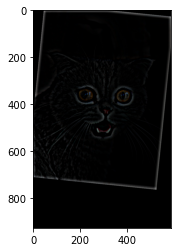

In [35]:
%matplotlib inline
plt.imshow(high_freq(cat2_aligned, 1e-3, 25, 15))

0.41521489565995706
0.003005657353538169
0.41521489565995706
0.02012395513278314


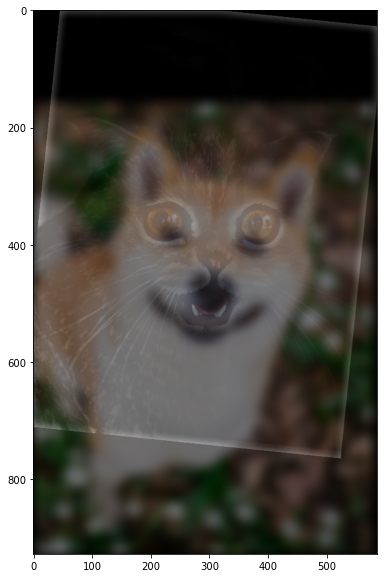

In [36]:
# dog is low freq and cat is high freq
%matplotlib inline
_, _, hybrid, fig = hybrid_image(dog_aligned, cat2_aligned, 1e-3, 1e-3, (30,30), (30/3, 30/3))
savefig('dogcat.png', fig)

In [37]:
apple = plt.imread('images/apple.jpeg')/255
orange = plt.imread('images/orange.jpeg')/255

In [38]:
app_h, app_w, _ = apple.shape
or_h, or_w, _ = orange.shape

In [39]:
def gaussian_stack(image, kernelsize, sigma, title=None):
    convolve_image = np.zeros_like(image)
    convolve_image[:,:,0] = gaussian(image[:,:,0], kernelsize, sigma)
    convolve_image[:,:,1] = gaussian(image[:,:,1], kernelsize, sigma)
    convolve_image[:,:,2] = gaussian(image[:,:,2], kernelsize, sigma)
    fig = plt.figure(figsize=(10,10))
    plt.imshow(convolve_image)
    if title:
        plt.title(title)
        savefig(title, fig)
    return convolve_image

Text(0.5, 1.0, 'apple')

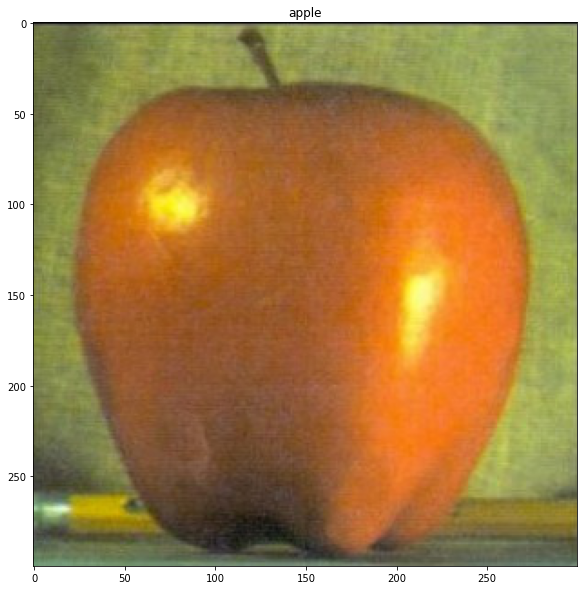

In [40]:
plt.figure(figsize=(10,10))
plt.imshow(apple)
plt.title('apple')

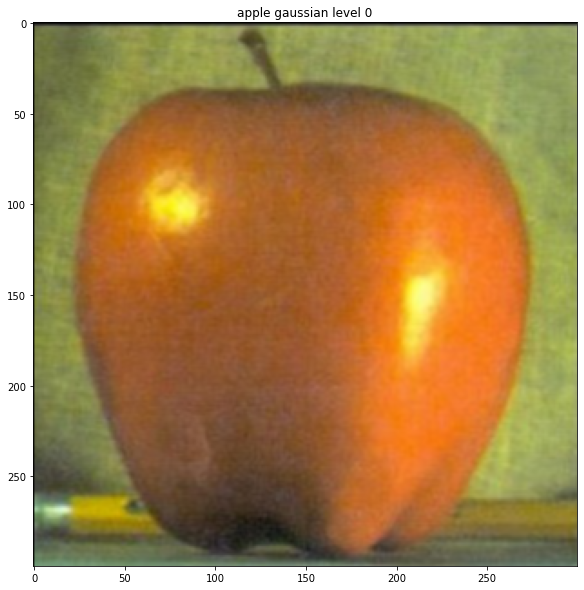

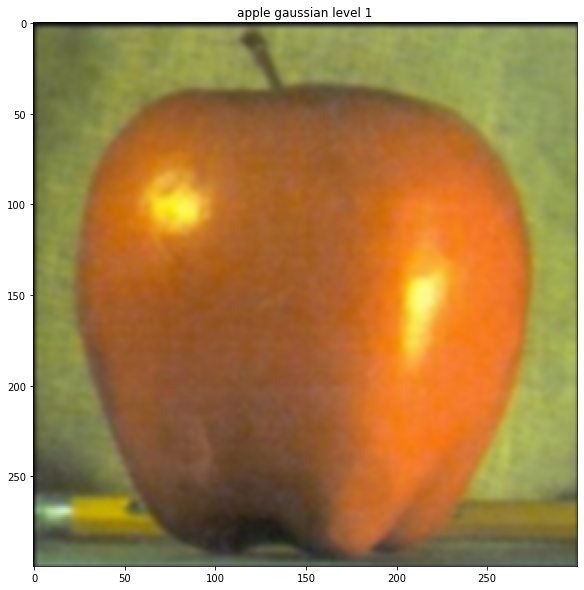

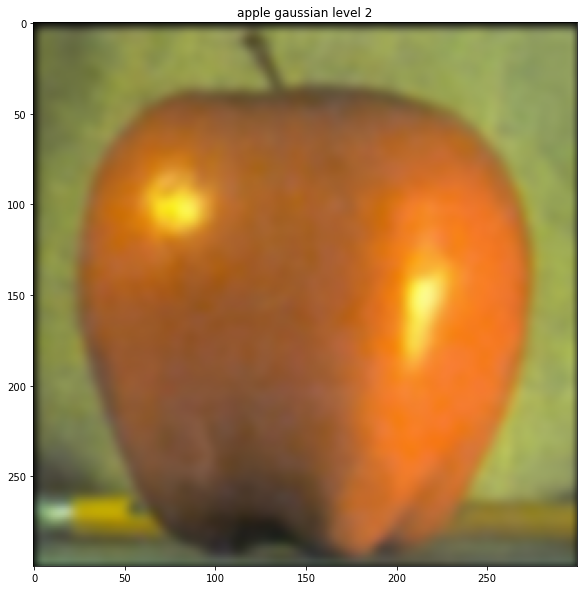

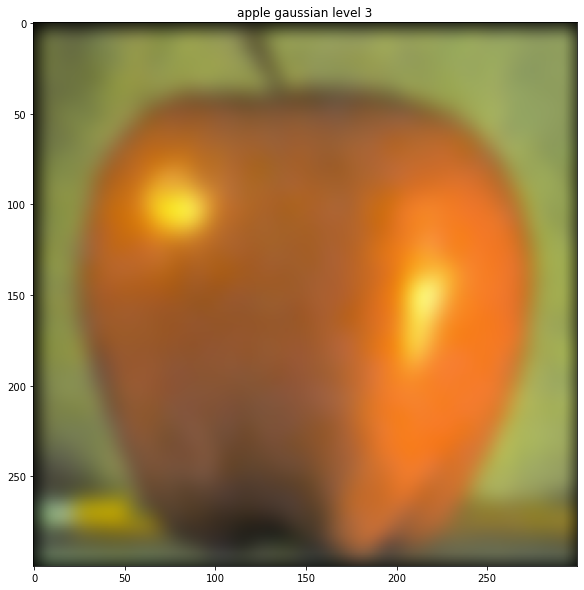

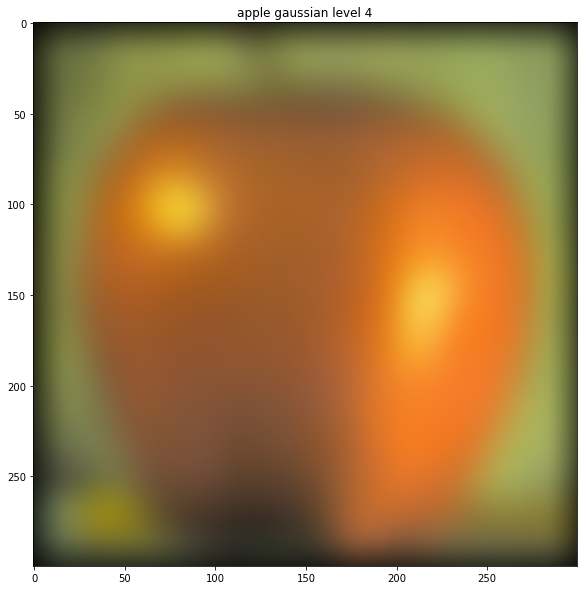

In [41]:
split = or_w // 2
apple_split = apple
# apple_split = np.zeros_like(apple)
# apple_split[:,:split+1,:] = apple[:,:split+1,:]
apple_levels = {}
apple_levels['original'] = apple_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    apple_levels[str(i)] = gaussian_stack(apple_split, kernelsize, kernelsize/3, 'apple gaussian level ' + str(i))
    apple_split = apple_levels[str(i)]

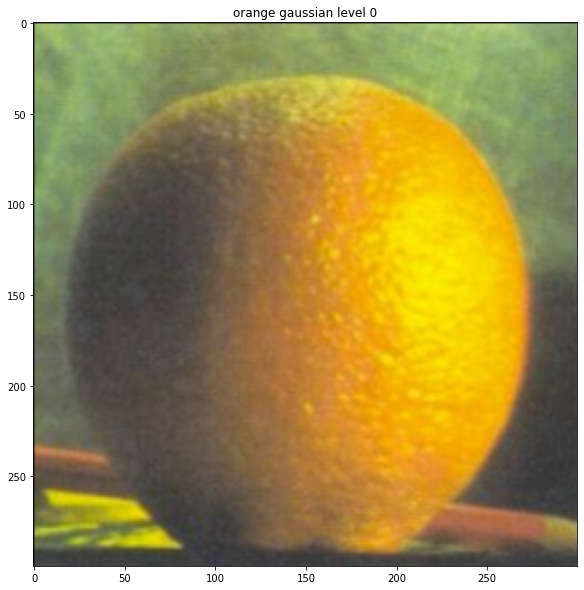

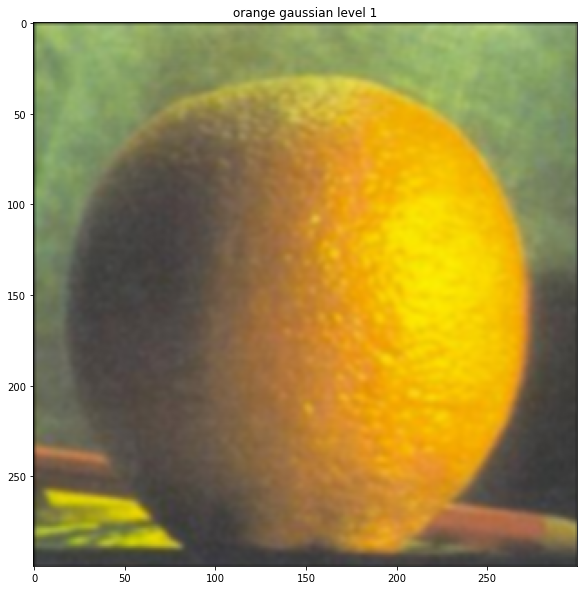

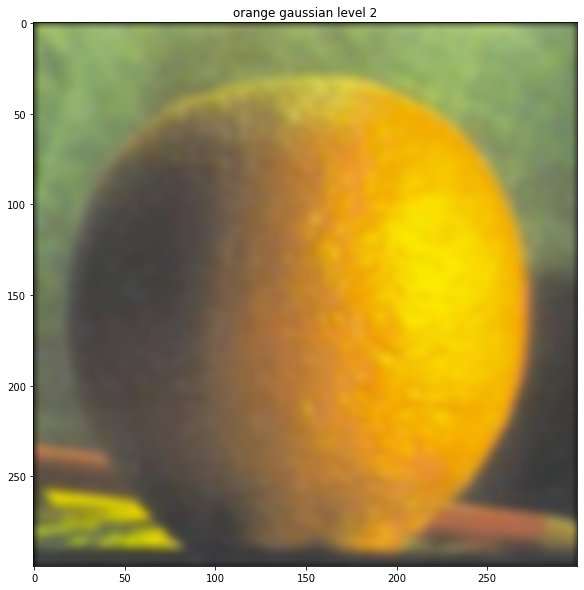

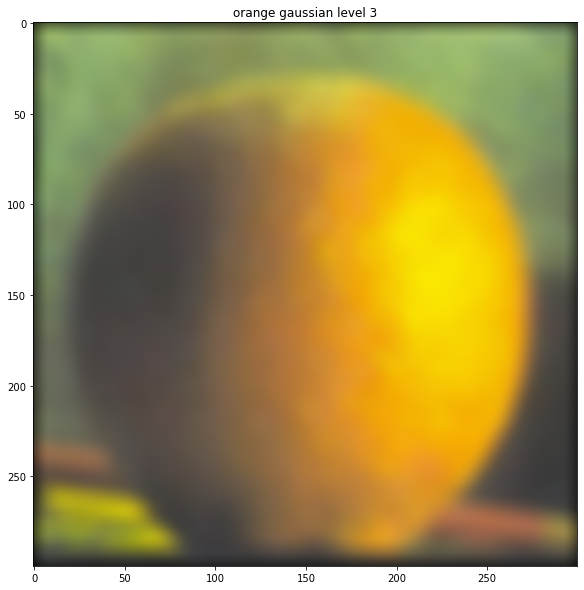

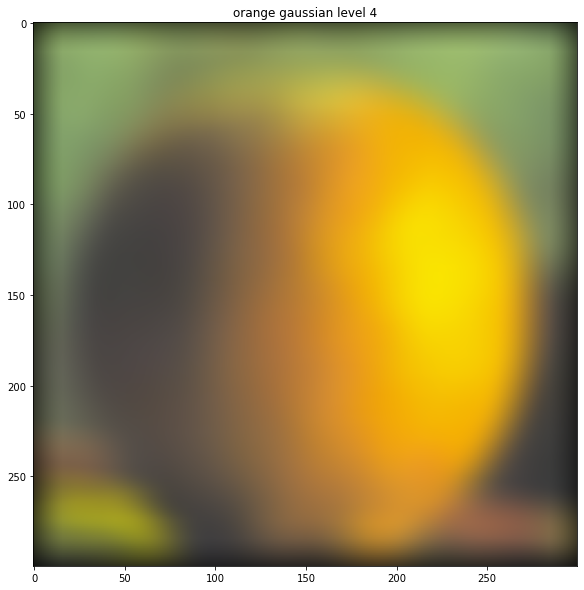

In [42]:
split = or_w // 2
orange_split = orange
# orange_split = np.zeros_like(orange)
# orange_split[:,split:,:] = orange[:,split:,:]
orange_levels = {}
orange_levels['original'] = orange_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    orange_levels[str(i)] = gaussian_stack(orange_split, kernelsize, kernelsize/3, 'orange gaussian level ' + str(i))
    apple_split = orange_levels[str(i)]

In [43]:
def laplacian_stack(laplacian, gaussian, title=None):
    for i in range(0, 5):
        if i != 4:
            laplacian[str(i)] = gaussian[str(i)] - gaussian[str(i+1)]
        else:
            laplacian[str(i)] = gaussian[str(i)]
        fig = plt.figure(figsize=(10,10))
        plt.imshow(cv2.normalize(laplacian[str(i)], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
        if title:
            plt.title(title + ' laplacian level ' + str(i))
            savefig(title  + ' laplacian level ' + str(i), fig)
    return

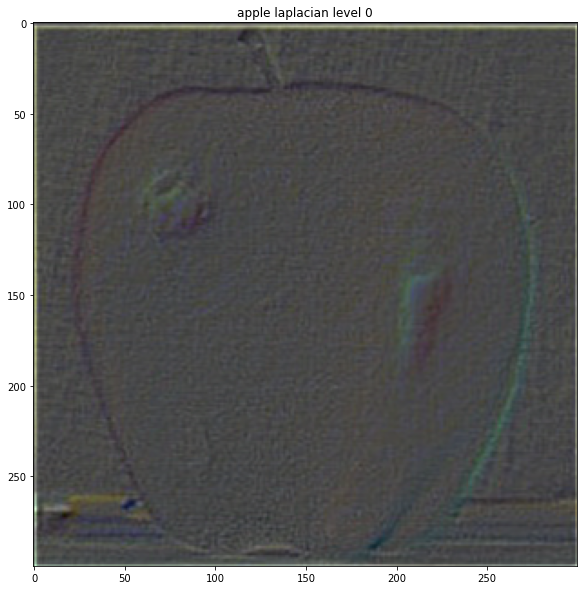

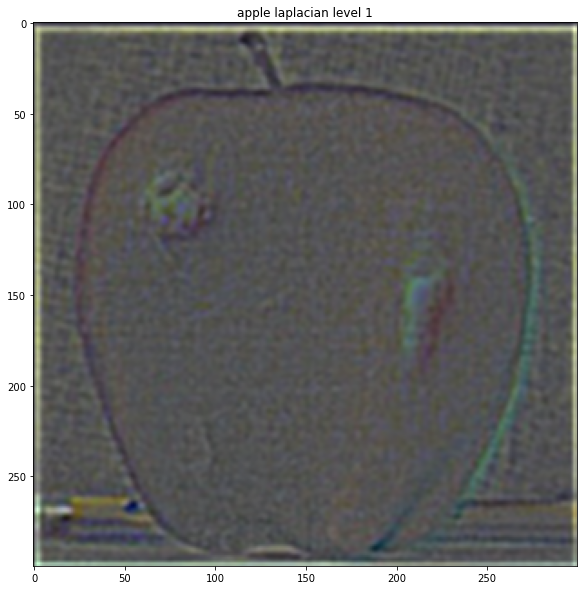

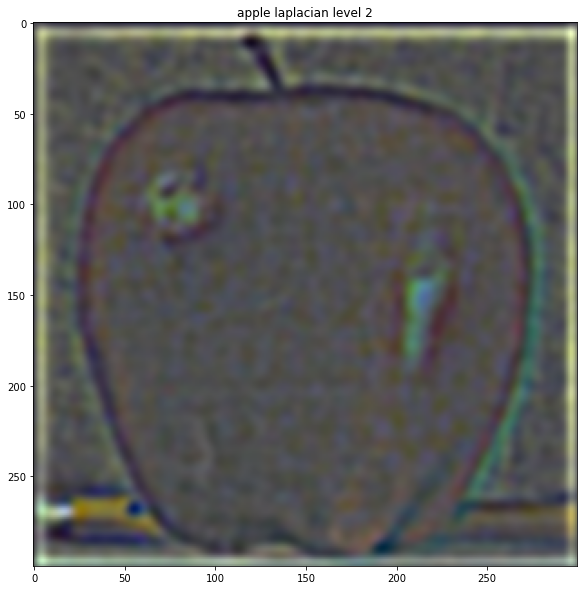

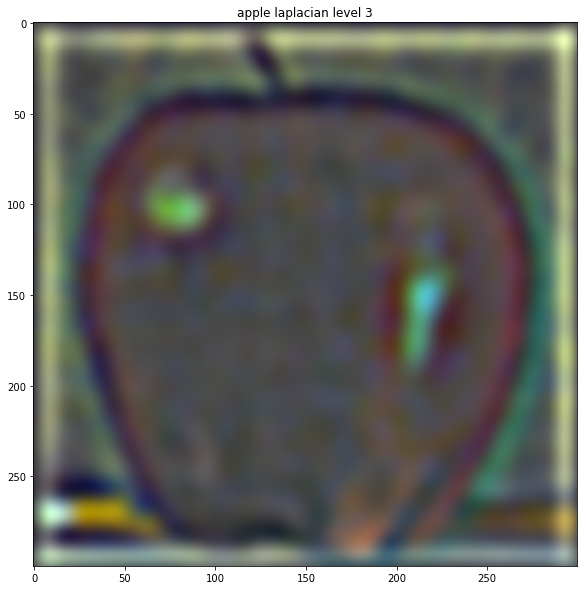

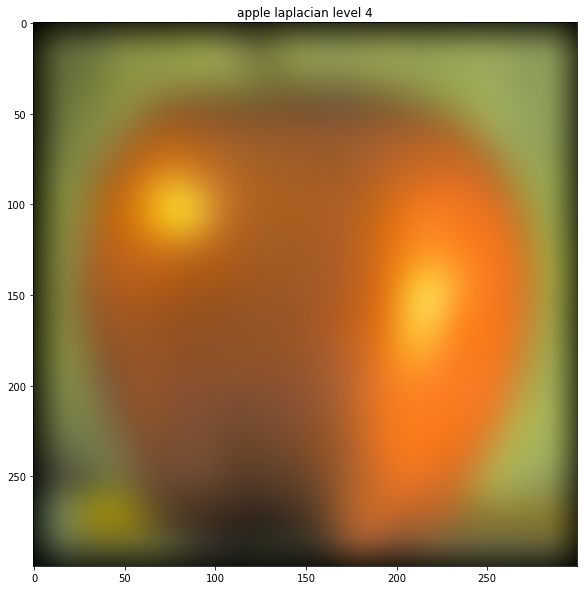

In [44]:
laplacian_apple = {}
laplacian_stack(laplacian_apple, apple_levels, 'apple')

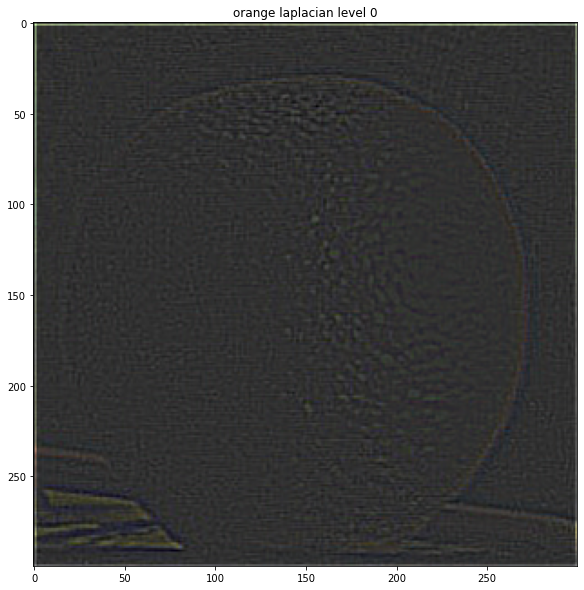

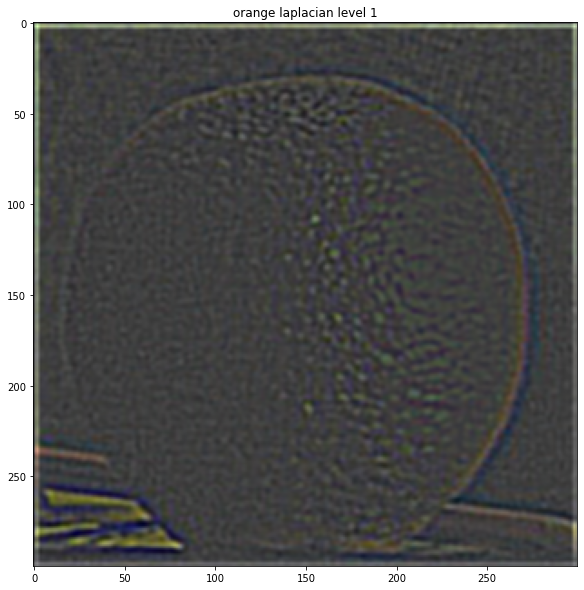

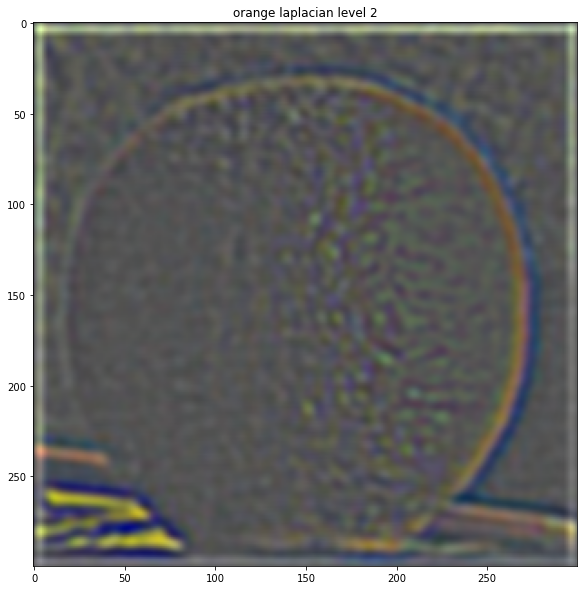

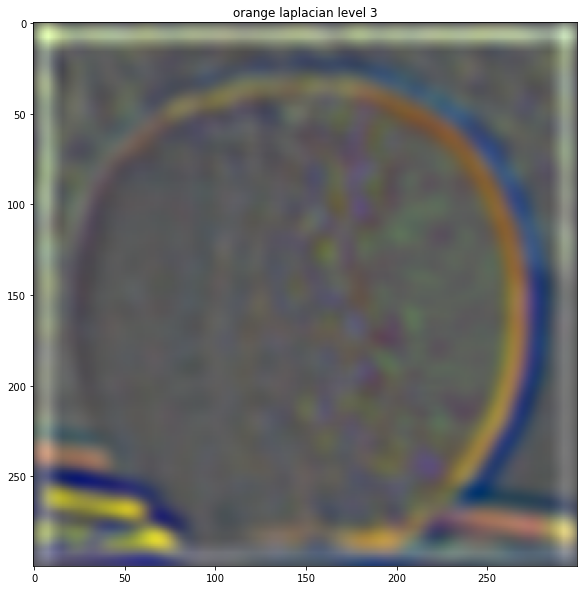

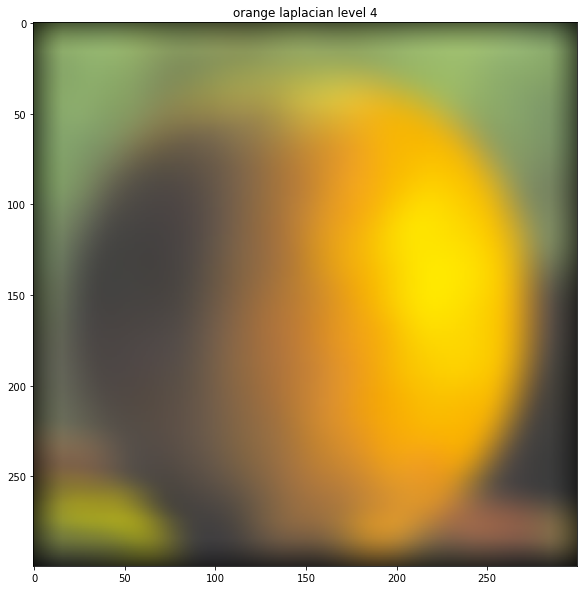

In [45]:
laplacian_orange = {}
laplacian_stack(laplacian_orange, orange_levels, 'orange')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


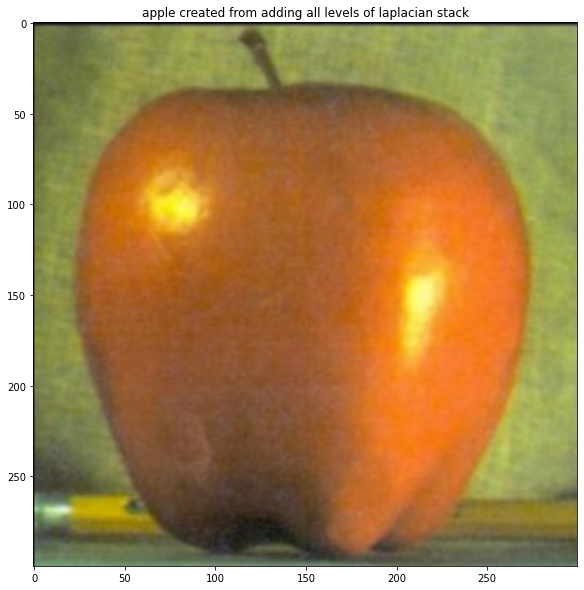

In [46]:
apple_recreated = np.zeros_like(apple_split)
for i in laplacian_apple:
    apple_recreated += laplacian_apple[i]
laplacian_apple['recreated original'] = apple_recreated
fig = plt.figure(figsize=(10,10))
plt.imshow(apple_recreated)
plt.title('apple created from adding all levels of laplacian stack')
savefig('recreated laplacian apple', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


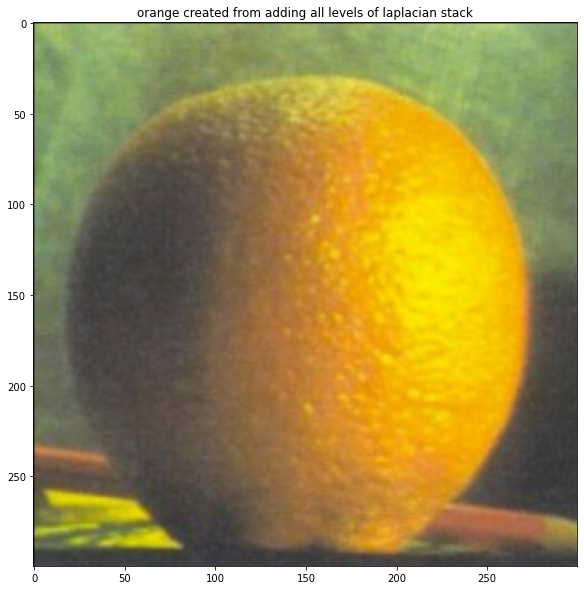

In [47]:
orange_recreated = np.zeros_like(orange_split)
for i in laplacian_orange:
    orange_recreated += laplacian_orange[i]
laplacian_orange['recreated original'] = orange_recreated
fig = plt.figure(figsize=(10,10))
plt.imshow(orange_recreated)
plt.title('orange created from adding all levels of laplacian stack')
savefig('recreated laplacian orange', fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


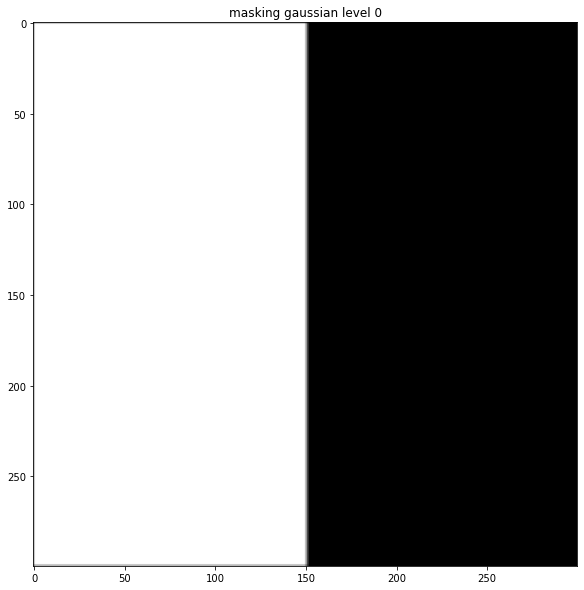

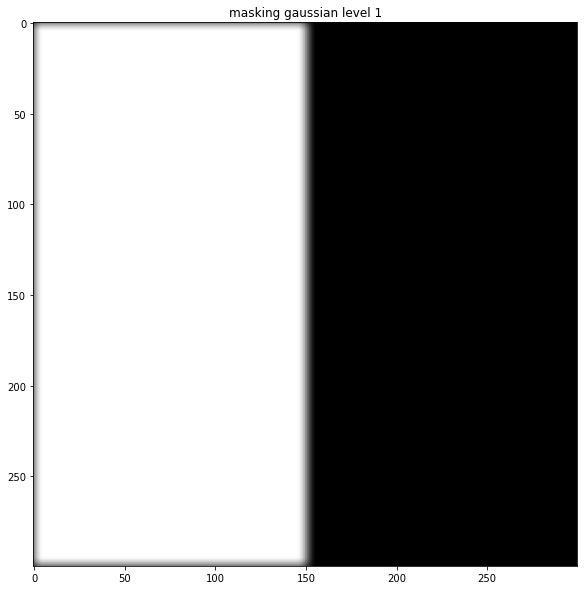

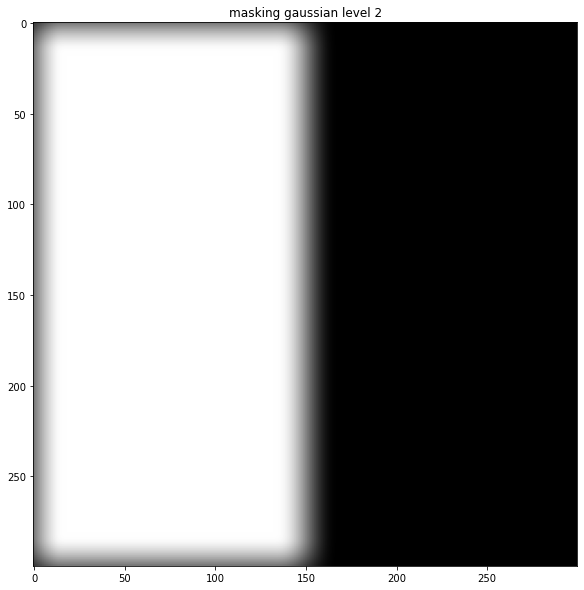

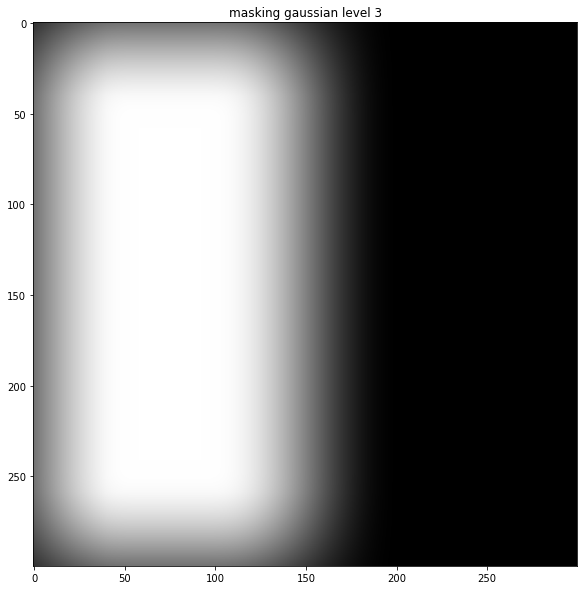

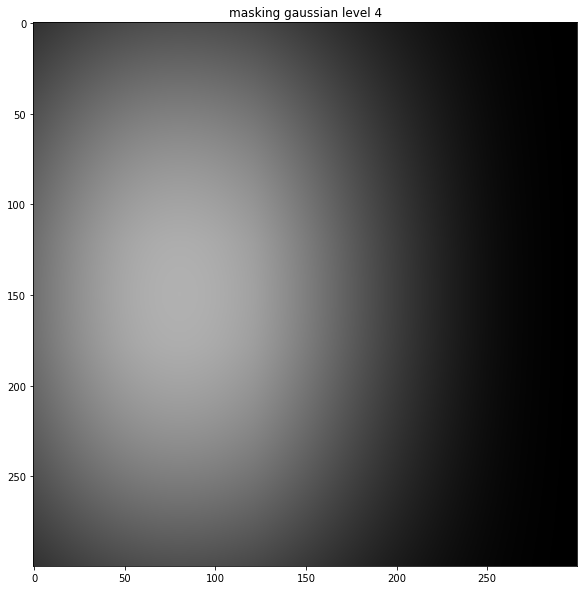

In [48]:
gauss_mask = np.zeros_like(apple)
gauss_mask[:,:split+1,:] = 1
mask_levels = {}
mask_levels['original'] = gauss_mask
for i in range(0, 5):
    kernelsize = 3 ** (i+1)
    mask_levels[str(i)] = gaussian_stack(gauss_mask, kernelsize, kernelsize/3, 'masking gaussian level ' + str(i))
    gauss_mask = mask_levels[str(i)]

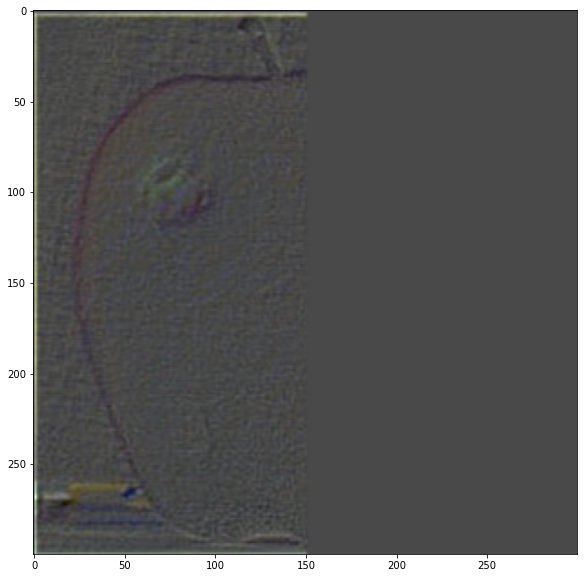

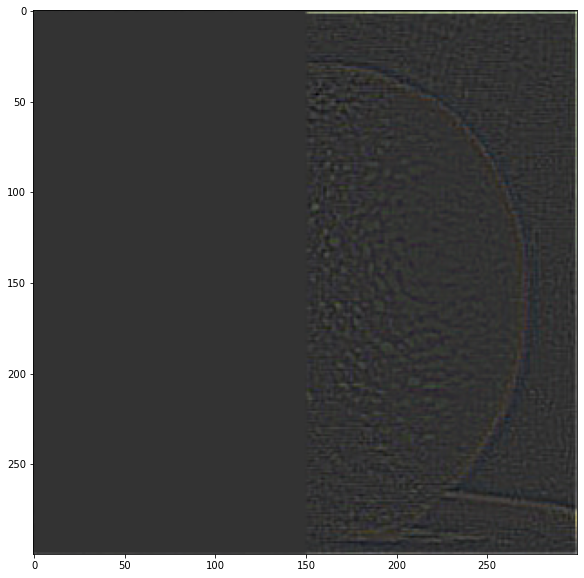

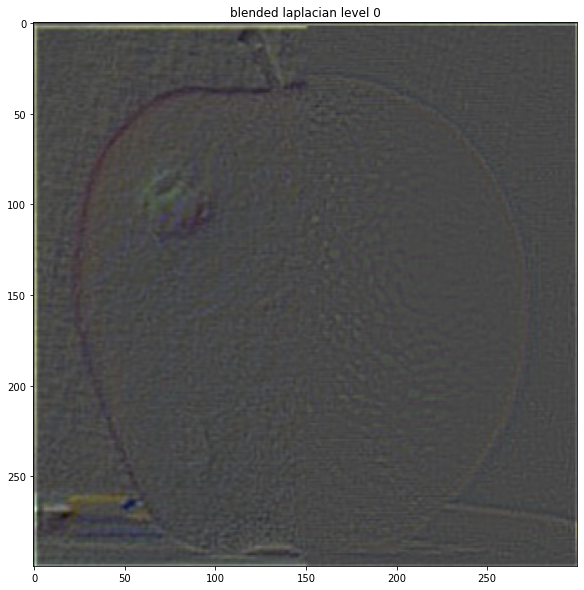

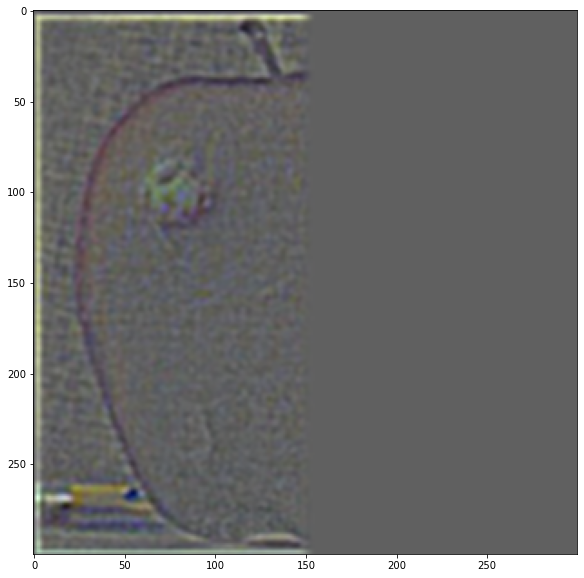

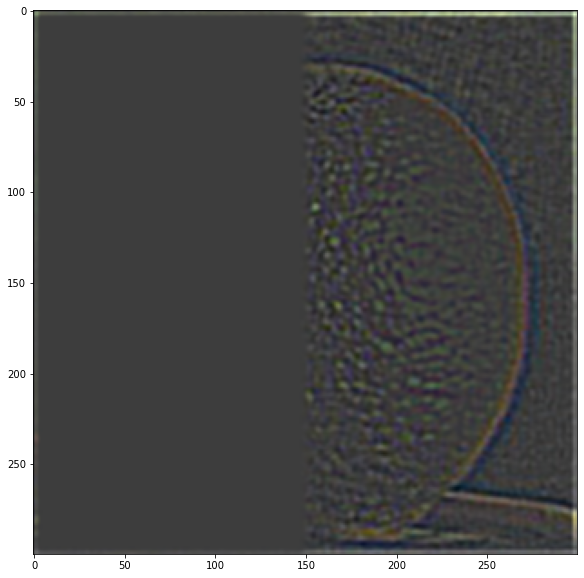

...

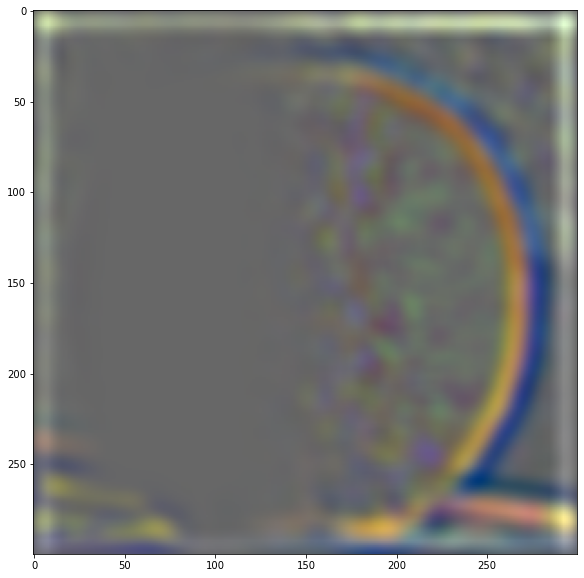

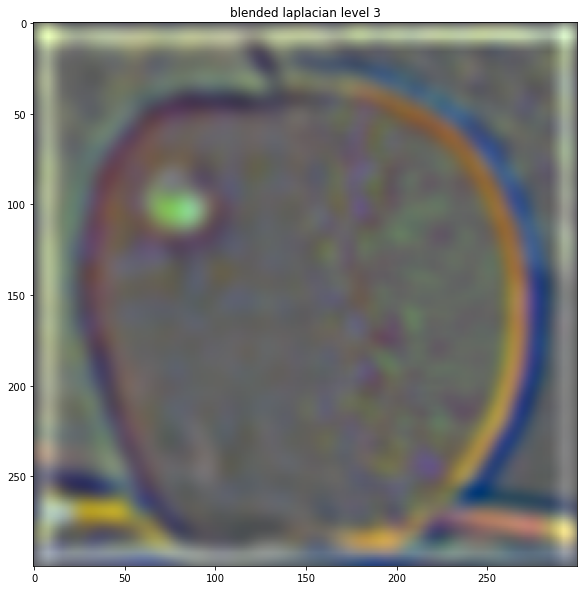

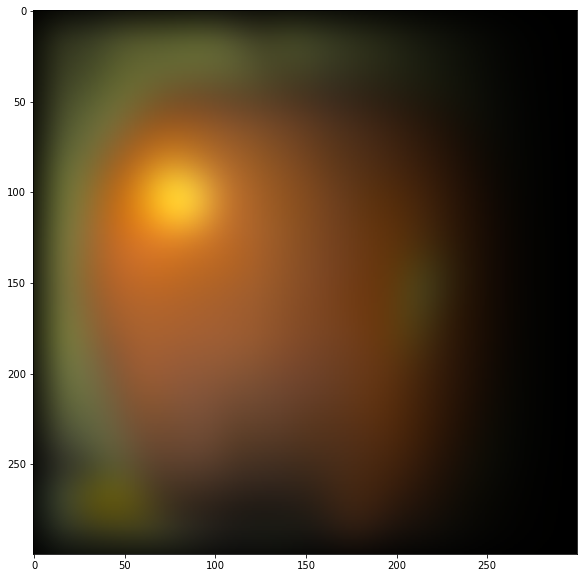

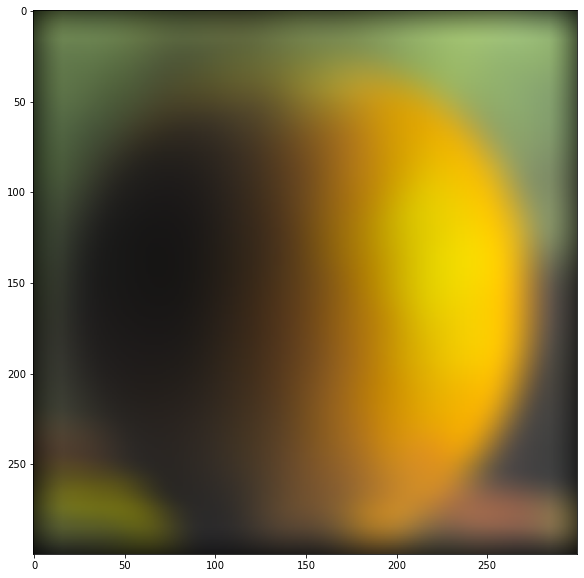

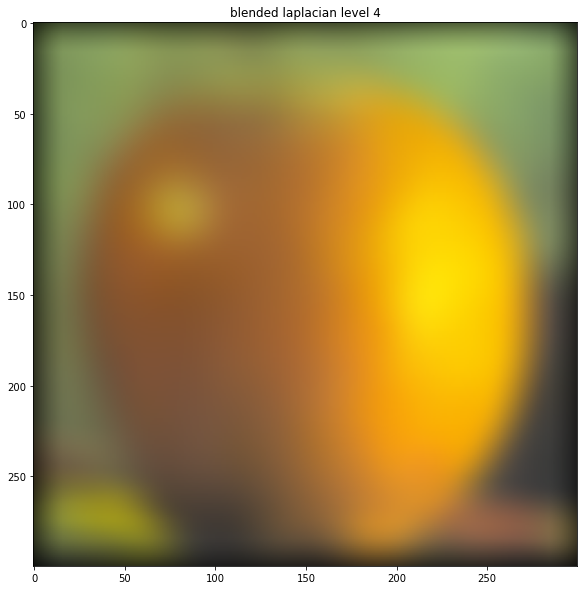

In [49]:
laplacian_blend = {}
LHS={}
RHS={}
for i in laplacian_apple:
    if i == 'recreated original':
        continue
    laplacian_blend[i] = np.zeros_like(laplacian_apple[i])
    fig = plt.figure(figsize=(10,10))
    LHS[i] = mask_levels[i]*laplacian_apple[i]
    plt.imshow(cv2.normalize(mask_levels[i]*laplacian_apple[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
    savefig('LHS ' + i, fig)
    fig = plt.figure(figsize=(10,10))
    RHS[i] = (1-mask_levels[i])*laplacian_orange[i]
    plt.imshow(cv2.normalize((1-mask_levels[i])*laplacian_orange[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
    savefig('RHS ' + i, fig)
    laplacian_blend[i] = mask_levels[i]*laplacian_apple[i] + (1-mask_levels[i])*laplacian_orange[i]
#     laplacian_blend[i][:,:,0] = np.multiply(gauss_spread[:,:,0], laplacian_apple[i][:,:,0]) + np.multiply(1-gauss_spread[:,:,0], laplacian_orange[i][:,:,0])
#     laplacian_blend[i][:,:,1] = np.multiply(gauss_spread[:,:,1], laplacian_apple[i][:,:,1]) + np.multiply(1-gauss_spread[:,:,1], laplacian_orange[i][:,:,1])
#     laplacian_blend[i][:,:,2] = np.multiply(gauss_spread[:,:,2], laplacian_apple[i][:,:,2]) + np.multiply(1-gauss_spread[:,:,2], laplacian_orange[i][:,:,2])
    fig = plt.figure(figsize=(10,10))
    plt.imshow(cv2.normalize(laplacian_blend[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
    plt.title('blended laplacian level ' + i)
    savefig('blended laplacian level ' + i, fig)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


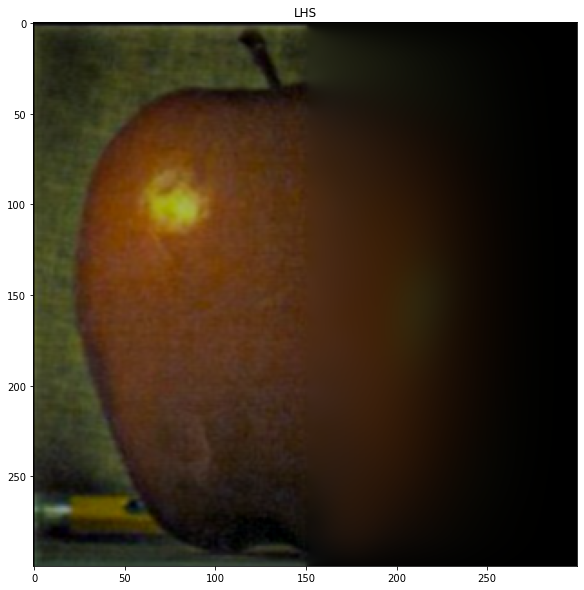

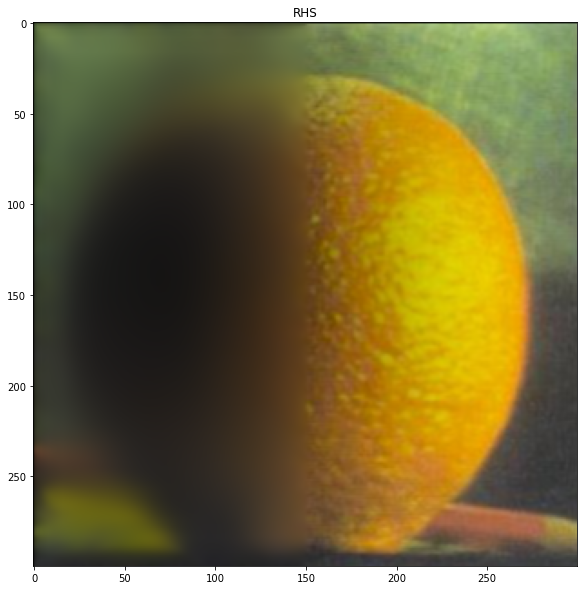

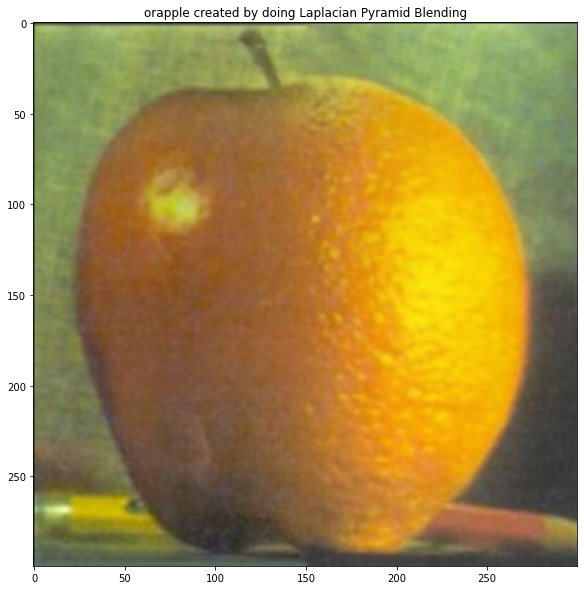

In [50]:
left = np.zeros_like(orange_split)
right = np.zeros_like(orange_split)
# orapple = np.zeros_like(orange_split)
for i in laplacian_blend:
    left += LHS[i]
    right += RHS[i]
#     orapple += laplacian_blend[i]
fig = plt.figure(figsize=(10,10))
plt.imshow(left)
plt.title('LHS')
savefig('LHS recreated', fig)

fig = plt.figure(figsize=(10,10))
plt.imshow(right)
plt.title('RHS')
savefig('RHS recreated', fig)

fig = plt.figure(figsize=(10,10))
plt.imshow(left + right)
plt.title('orapple created by doing Laplacian Pyramid Blending')
savefig('orapple', fig)

In [51]:
# blended = {}
# for i in laplacian_apple:
#     blended[i] = laplacian_apple[i] + laplacian_orange[i]
#     plt.figure(figsize=(10,10))
#     plt.imshow(cv2.normalize(blended[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
#     plt.title(i)

In [52]:
lionface = plt.imread('images/lionface.jpeg')/255
tigerface = plt.imread('images/tigerface.jpg')/255

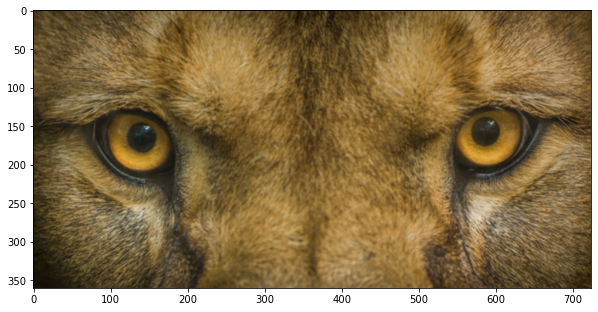

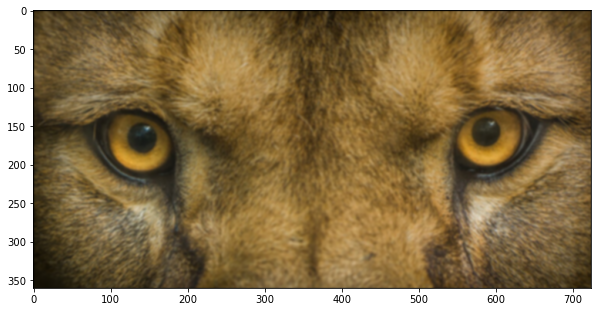

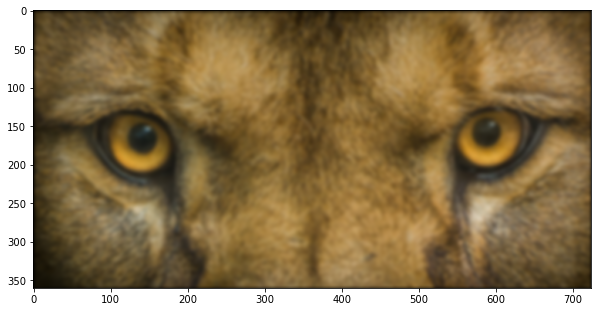

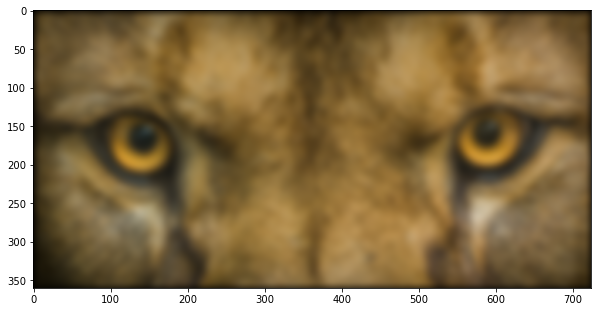

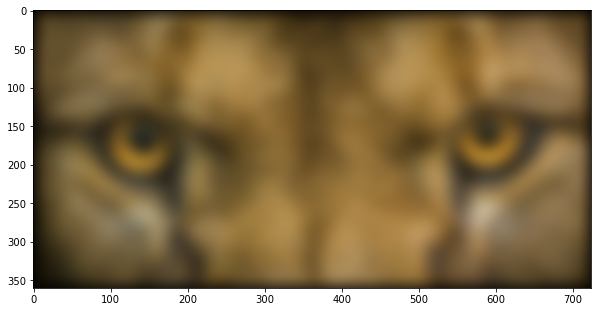

In [53]:
lion_split = lionface
lion_levels = {}
lion_levels['original'] = lion_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    lion_levels[str(i)] = gaussian_stack(lion_split, kernelsize, kernelsize/3)
    lion_split = lion_levels[str(i)]

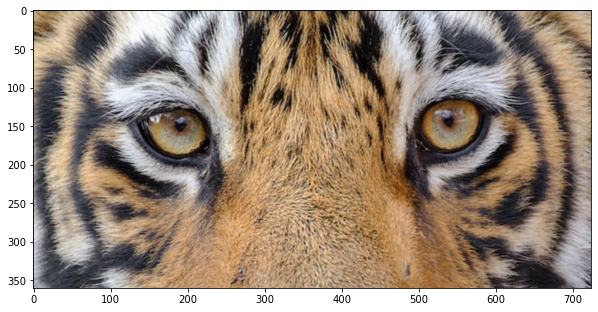

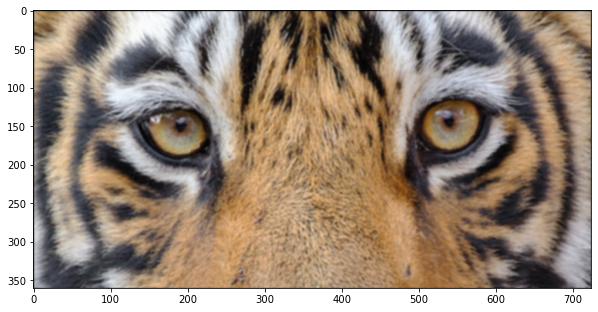

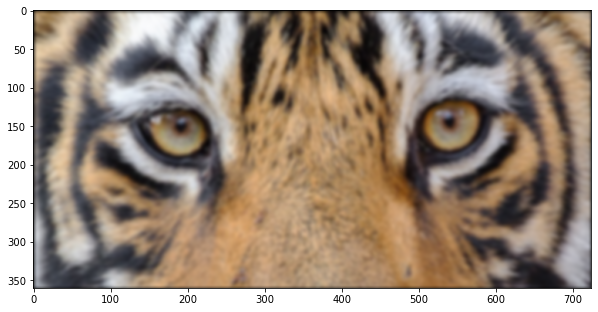

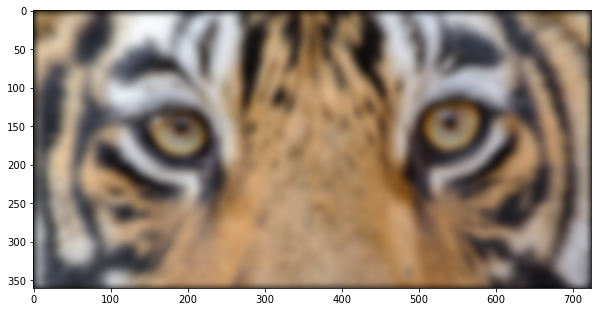

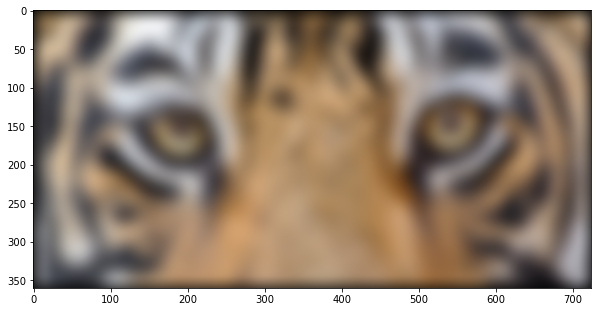

In [54]:
tiger_split = tigerface
tiger_levels = {}
tiger_levels['original'] = tiger_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    tiger_levels[str(i)] = gaussian_stack(tiger_split, kernelsize, kernelsize/3)
    tiger_split = tiger_levels[str(i)]

In [ ]:
gauss_mask1 = np.zeros_like(tigerface)
gauss_mask1[:,:tigerface.shape[1]//2,:] = 1
mask_levels1 = {}
mask_levels1['original'] = gauss_mask1
for i in range(0, 5):
    kernelsize = 3 ** (i+1)
    mask_levels1[str(i)] = gaussian_stack(gauss_mask1, kernelsize, kernelsize/3)
    gauss_mask1 = mask_levels1[str(i)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [ ]:
laplacian_lion = {}
laplacian_stack(laplacian_lion, lion_levels)

In [ ]:
laplacian_tiger = {}
laplacian_stack(laplacian_tiger, tiger_levels)

In [ ]:
liger_blend = {}
for i in laplacian_lion:
    if i == 'original':
        continue
    liger_blend[i] = np.zeros_like(laplacian_lion[i])
    liger_blend[i] = mask_levels1[i]*laplacian_lion[i] + (1-mask_levels1[i])*laplacian_tiger[i]
    fig = plt.figure(figsize=(10,10))
    plt.imshow(cv2.normalize(liger_blend[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
    plt.title('blended liger laplacian level ' + i)
    savefig('blended liger laplacian level ' + i, fig)

In [ ]:
liger = np.zeros_like(lionface)
for i in liger_blend:
    liger += liger_blend[i]
fig = plt.figure(figsize=(10,10))
plt.imshow(liger)
plt.title('Liger created by doing Laplacian Pyramid Blending')
savefig('liger', fig)

In [ ]:
obama = plt.imread('images/obama.jpg')/255
obama_face = plt.imread('images/obamaface.png')
trump = plt.imread('images/trump.jpg')/255

In [ ]:
obama_split = obama
obama_levels = {}
obama_levels['original'] = obama_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    obama_levels[str(i)] = gaussian_stack(obama_split, kernelsize, kernelsize/3)
    obama_split = obama_levels[str(i)]

In [ ]:
trump_split = trump
trump_levels = {}
trump_levels['original'] = trump_split
for i in range(0, 5):
    kernelsize = 2 ** (i+1)
    trump_levels[str(i)] = gaussian_stack(trump_split, kernelsize, kernelsize/3)
    trump_split = trump_levels[str(i)]

In [ ]:
plt.imshow(obama_face)

In [ ]:
obama_face.shape

In [ ]:
plt.imshow(obama_face[:,:,-1])

In [ ]:
obama_mask = np.zeros((540, 960))
for i in range(len(obama_face[:,:,-1])):
    obama_mask[i] = np.pad(obama_face[:,:,-1][i], 309, 'constant', constant_values=(0,0))
obama_mask.shape

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(obama_mask)

In [ ]:
np.mean(obama_mask)

In [ ]:
obama_mask[200, 400]

In [ ]:
mask_split = np.empty(obama.shape)
mask_split[:,:,0] = obama_mask
mask_split[:,:,1] = obama_mask
mask_split[:,:,2] = obama_mask

In [ ]:
face_levels = {}
face_levels['original'] = mask_split
for i in range(0, 5):
    kernelsize = 3 ** (i+1)
    face_levels[str(i)] = gaussian_stack(mask_split, kernelsize, kernelsize/3)
    mask_split = face_levels[str(i)]

In [ ]:
laplacian_obama = {}
laplacian_stack(laplacian_obama, obama_levels)

In [ ]:
laplacian_trump = {}
laplacian_stack(laplacian_trump, trump_levels)

In [ ]:
pres_blend = {}
for i in laplacian_obama:
    if i == 'original':
        continue
    pres_blend[i] = np.zeros_like(laplacian_obama[i])
    pres_blend[i] = face_levels[i]*laplacian_obama[i] + (1-face_levels[i])*laplacian_trump[i]
    fig = plt.figure(figsize=(10,10))
    plt.imshow(cv2.normalize(pres_blend[i], None, 0,255, cv2.NORM_MINMAX, cv2.CV_8UC1))
    plt.title('blended president laplacian level ' + i)
    savefig('blended president laplacian level ' + i, fig)

In [ ]:
mypresident = np.zeros_like(obama)
for i in pres_blend:
    mypresident += pres_blend[i]
fig = plt.figure(figsize=(10,10))
plt.imshow(mypresident)
plt.title('Blended presidents created by doing Laplacian Pyramid Blending')
savefig('mypresident', fig)